In [32]:
#!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 1.5 MB/s eta 0:00:00a 0:00:01m
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 1.5 MB/s eta 0:00:0000:0100:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.1/31.1 MB 6.1 MB/s eta 0:00:0000:0100:01
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=d301ba8ecff4252022eeb66797a81f34eb0424f87df64f6844a33b35baa70834
  Stored in directory: /Users/vitor.marques/Library/Caches/pip/wheels/de/07/2e/814a6ee82e37528f2044a609a431028375b149bc31f03c0e27
Successfully built umap-learn
DEPRECATION: google-images-search 1.4.6 has a non-standard dependency specifier click>=7.0<=8.1.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of google-images-search or contact the author to suggest that they release a version with a confo

In [85]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from umap import UMAP  # Import UMAP from umap-learn

In [86]:
# Filter FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load the apples dataset
apples = pd.read_csv('apple_quality.csv')

# Remove leading and trailing whitespace from column names
apples.columns = apples.columns.str.strip()

In [71]:
temp = apples.drop(columns=["Quality"])

In [72]:
print(temp.mean())
print(temp.std())

A_id           1999.500000
Size             -0.503015
Weight           -0.989547
Sweetness        -0.470479
Crunchiness       0.985478
Juiciness         0.512118
Ripeness          0.498277
Acidity           0.076877
dtype: float64
A_id           1154.844867
Size              1.928059
Weight            1.602507
Sweetness         1.943441
Crunchiness       1.402757
Juiciness         1.930286
Ripeness          1.874427
Acidity           2.110270
dtype: float64


In [73]:
# Create new features
apples['Density'] = apples['Weight'] / apples['Size']
apples['SA Combo'] = apples['Acidity'] + apples['Sweetness']
apples['Texture'] = apples['Crunchiness'] + apples['Juiciness']
apples['Size_Weight'] = apples['Size'] + apples['Weight']
apples['Size_Juiciness'] = apples['Size'] + apples['Juiciness']
apples['Juiciness_Sweetness'] = apples['Juiciness'] + apples['Sweetness']
apples['Juiciness_Ripeness'] = apples['Juiciness']**2 / apples['Ripeness']**2
apples['Size_Weight_Crunchiness'] = apples['Size'] * apples['Weight'] * apples['Crunchiness']
apples['Sweetness_Acidity_Juiceness'] = (apples['Sweetness'] + apples['Acidity'] + apples['Juiciness'])/3
apples['Overall_Texture'] = (apples['Sweetness'] + apples['Crunchiness'] + apples['Juiciness'] + apples['Ripeness'])/4
apples['JS_SAJ'] = apples['Juiciness_Sweetness'] + apples['Sweetness_Acidity_Juiceness']
apples['Crunchiness_Weight'] = apples['Crunchiness'] + apples['Weight']

In [74]:
# Making 'Quality' the last column
cols = list(apples.columns.values)
cols.pop(cols.index('Quality'))
apples = apples[cols + ['Quality']]

In [87]:
# Standardize the data
standardize_scaler = StandardScaler()
standardized_data = standardize_scaler.fit_transform(apples.iloc[:, :-1])  # Exclude the 'Quality' column

# Convert the normalized data back to a DataFrame
standardized_df = pd.DataFrame(standardized_data, columns=apples.columns[:-1])

# Add the 'Quality' column back to the DataFrame
standardized_df['Quality'] = apples['Quality']

# Normalize the data
normalize_scaler = MinMaxScaler()
normalized_data = normalize_scaler.fit_transform(apples.iloc[:, :-1])

# Convert the normalized data back to a DataFrame
normalized_df = pd.DataFrame(normalized_data, columns=apples.columns[:-1])

# Add the 'Quality' column back to the DataFrame
normalized_df['Quality'] = apples['Quality']

In [88]:
# Filter FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load the apples dataset
#apples = pd.read_csv('apple_quality.csv')

# Remove leading and trailing whitespace from column names
apples.columns = apples.columns.str.strip()

# Label encoding for the 'Quality' column
label_encoder = LabelEncoder()
apples['Quality'] = label_encoder.fit_transform(apples['Quality'])

# Remove the 'A_id' column
apples = apples.drop(columns=['A_id'])

# Step 1: Descriptive statistics
print("Descriptive Statistics:")
print(apples.describe())


Descriptive Statistics:
              Size       Weight    Sweetness  Crunchiness    Juiciness  \
count  4000.000000  4000.000000  4000.000000  4000.000000  4000.000000   
mean     -0.503015    -0.989547    -0.470479     0.985478     0.512118   
std       1.928059     1.602507     1.943441     1.402757     1.930286   
min      -7.151703    -7.149848    -6.894485    -6.055058    -5.961897   
25%      -1.816765    -2.011770    -1.738425     0.062764    -0.801286   
50%      -0.513703    -0.984736    -0.504758     0.998249     0.534219   
75%       0.805526     0.030976     0.801922     1.894234     1.835976   
max       6.406367     5.790714     6.374916     7.619852     7.364403   

          Ripeness      Acidity      Quality  
count  4000.000000  4000.000000  4000.000000  
mean      0.498277     0.076877     0.501000  
std       1.874427     2.110270     0.500062  
min      -5.864599    -7.010538     0.000000  
25%      -0.771677    -1.377424     0.000000  
50%       0.503445     0.02

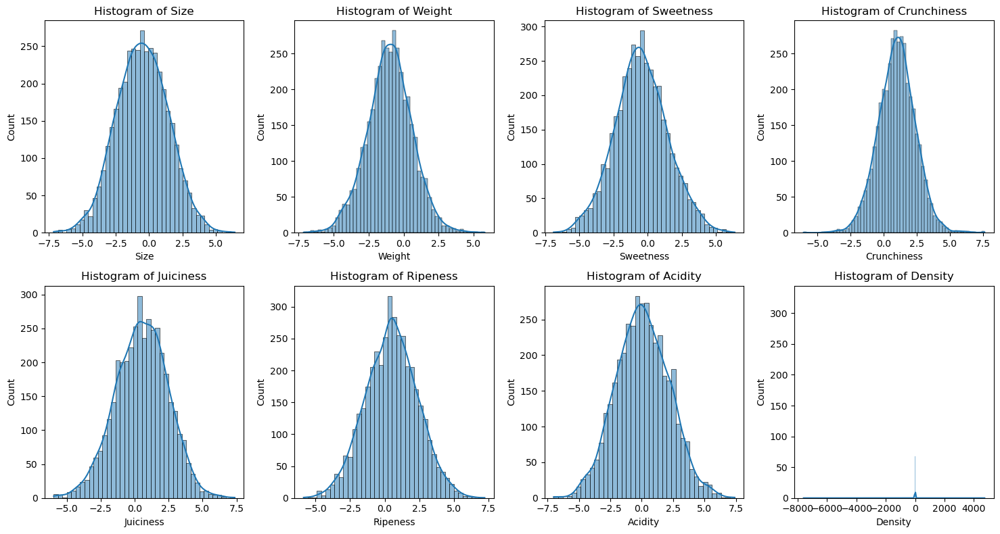

In [77]:
# Step 2: Visualizations for patterns, outliers, and correlations
# Histograms for each feature
plt.figure(figsize=(15, 8))
num_columns = min(8, len(apples.columns[:-1]))  # Limit to the available number of columns
for i, column in enumerate(apples.columns[:-1][:num_columns], start=1):
    plt.subplot(2, 4, i)  # Adjust the subplot grid as needed
    sns.histplot(apples[column], kde=True)
    plt.title(f'Histogram of {column}')
plt.tight_layout()
plt.show()

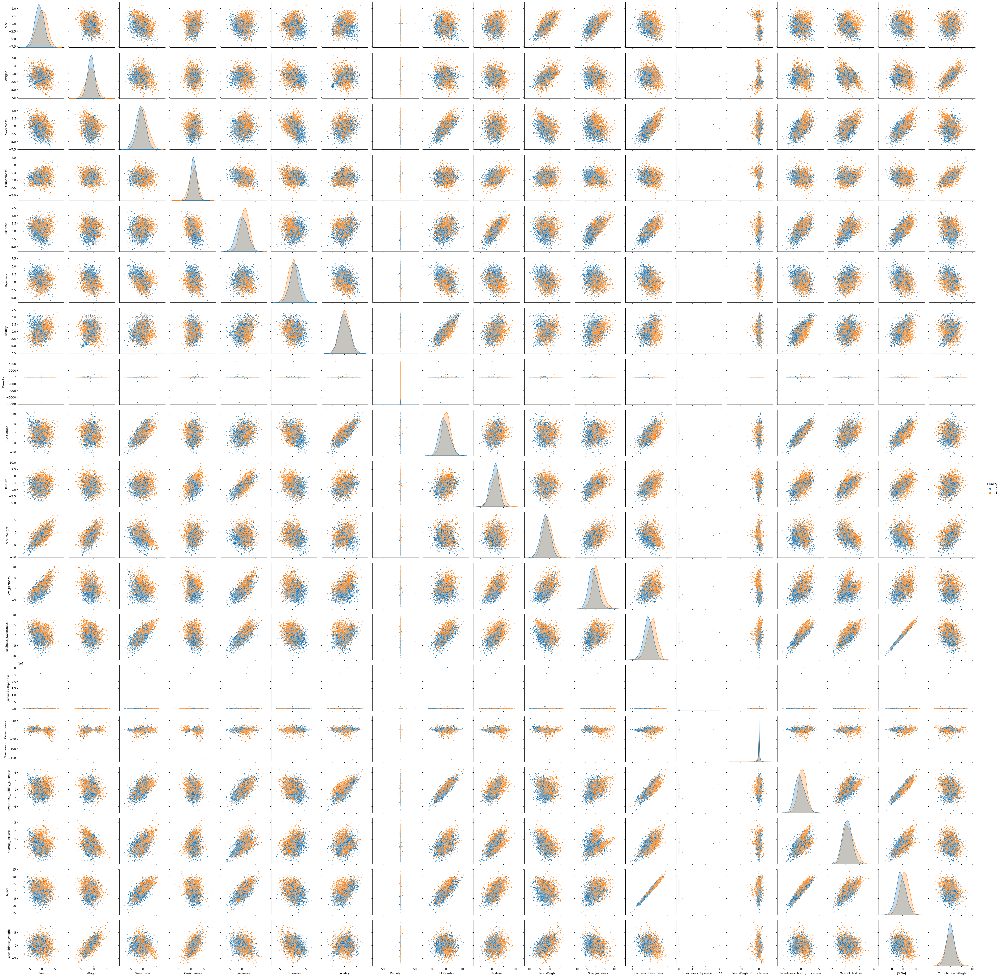

In [78]:
# Pairplot for overall distribution and relationships
sns.pairplot(apples, hue='Quality', plot_kws={'s': 5})
plt.show()

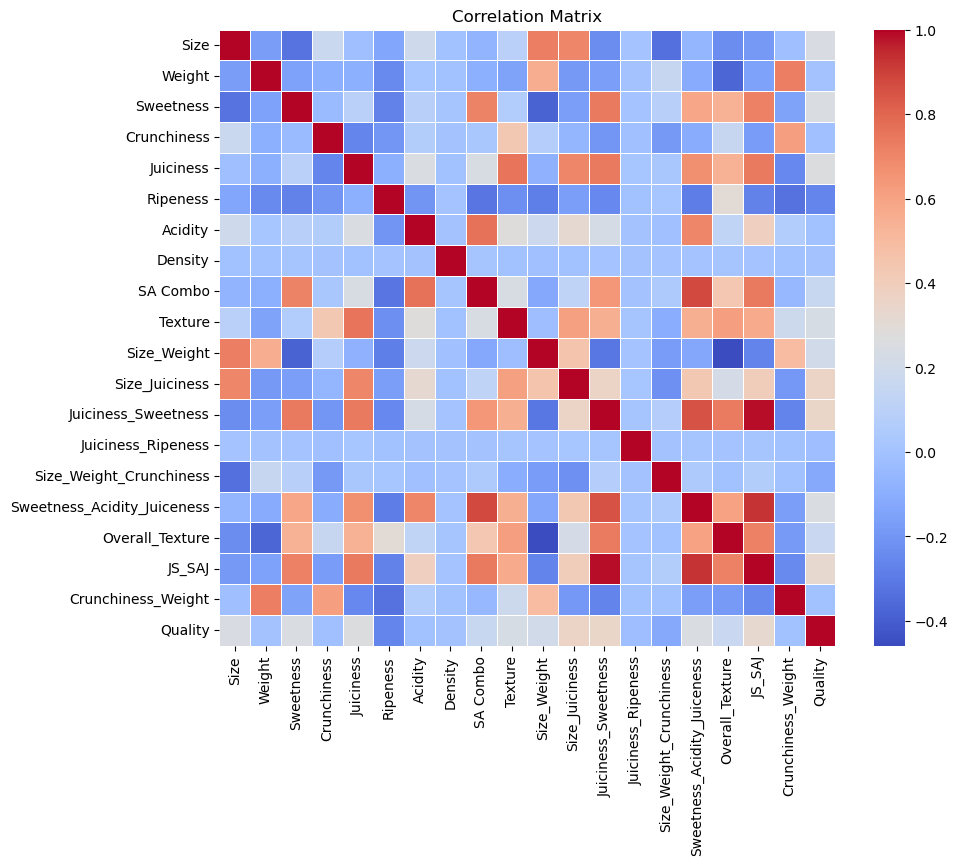

In [79]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(apples.corr(), annot=False, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True)
plt.title('Correlation Matrix')
plt.show()

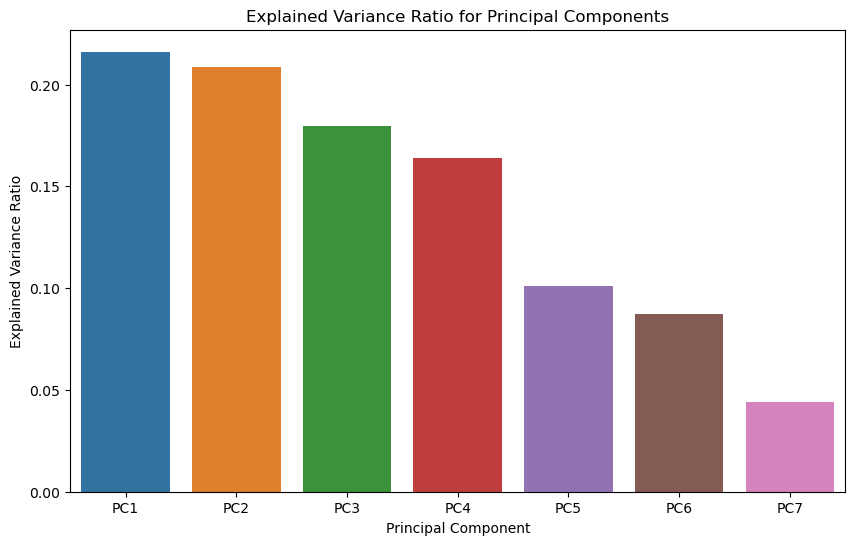

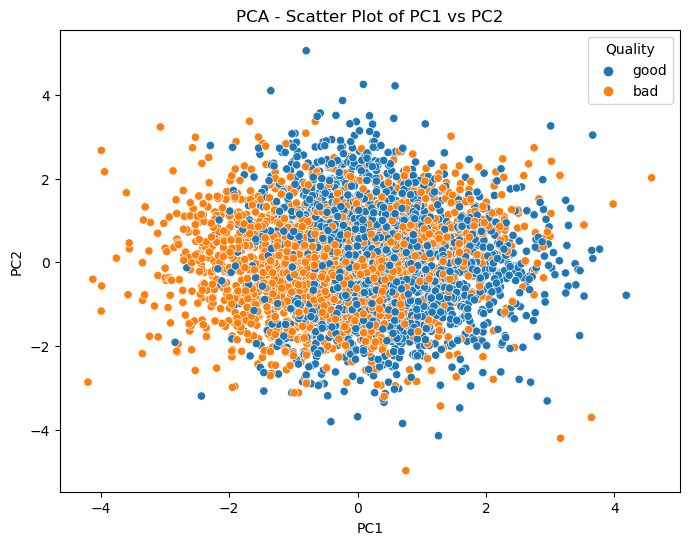

In [104]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# Load the apples dataset
apples = pd.read_csv('apple_quality.csv')

# Remove leading and trailing whitespace from column names
apples.columns = apples.columns.str.strip()

# Drop unnecessary columns (e.g., 'A_id' and 'Quality' for PCA)
pca_data = apples.drop(columns=['A_id', 'Quality'])

# Standardize the data for PCA
scaler = StandardScaler()
pca_data_standardized = scaler.fit_transform(pca_data)

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(pca_data_standardized)

# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=pca_result, columns=[f'PC{i}' for i in range(1, pca_data.shape[1] + 1)])

# Visualize the explained variance ratio
plt.figure(figsize=(10, 6))
sns.barplot(x=pca_df.columns, y=pca.explained_variance_ratio_)
plt.title('Explained Variance Ratio for Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.show()

# Scatter plot of the first two principal components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue=apples['Quality'], data=pca_df)
plt.title('PCA - Scatter Plot of PC1 vs PC2')
plt.show()


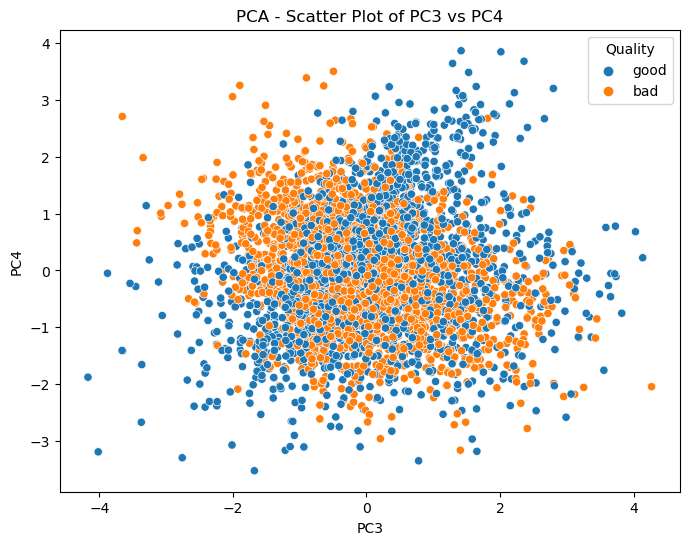

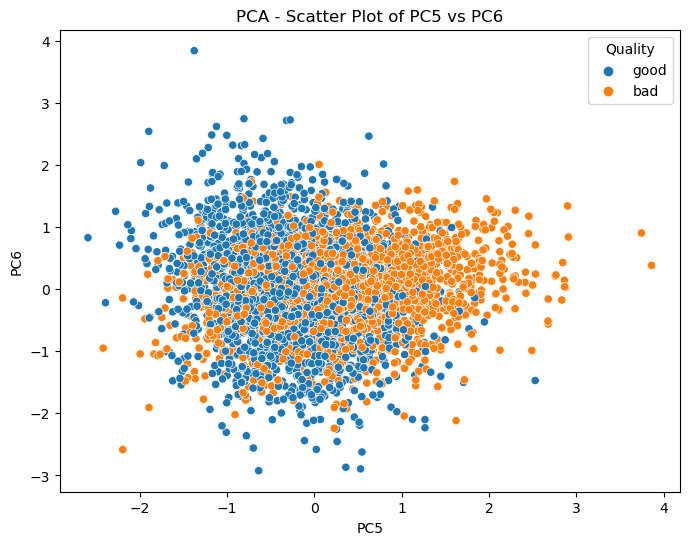

In [106]:
# Scatter plot of the third and fourth principal components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC3', y='PC4', hue=apples['Quality'], data=pca_df)
plt.title('PCA - Scatter Plot of PC3 vs PC4')
plt.show()

# Scatter plot of the fifth and sixth principal components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC5', y='PC6', hue=apples['Quality'], data=pca_df)
plt.title('PCA - Scatter Plot of PC5 vs PC6')
plt.show()

# Repeat the process for other principal component pairs as needed


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


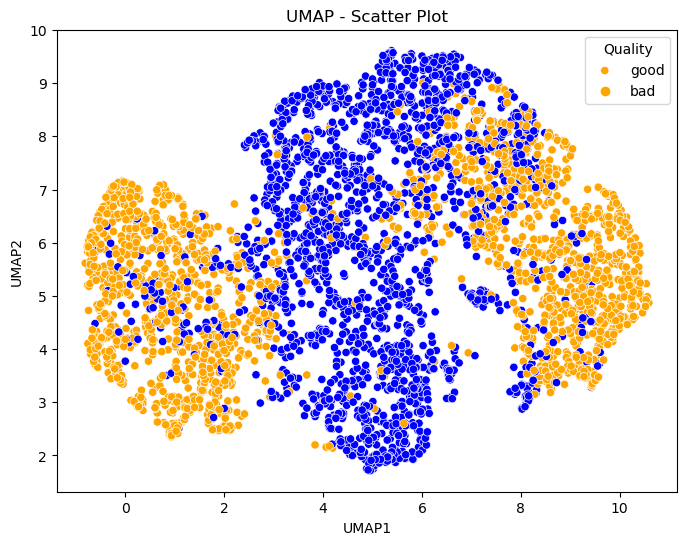

In [100]:
import pandas as pd
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt

# Load the apples dataset
apples = pd.read_csv('apple_quality.csv')

# Remove leading and trailing whitespace from column names
apples.columns = apples.columns.str.strip()

# Drop unnecessary columns (e.g., 'A_id' and 'Quality' for UMAP)
umap_data = apples.drop(columns=['A_id', 'Quality'])

# Apply UMAP
umap_result = UMAP(n_components=2).fit_transform(umap_data)

# Create a DataFrame with the UMAP components
umap_df = pd.DataFrame(data=umap_result, columns=['UMAP1', 'UMAP2'])

# Scatter plot of the UMAP components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='UMAP1', y='UMAP2', hue=apples['Quality'], data=umap_df, palette={'good': 'orange', 'bad': 'blue'})
plt.title('UMAP - Scatter Plot')
plt.legend(title='Quality', loc='upper right', labels=['good', 'bad'])
plt.show()


In [ ]:
from scipy.stats import f_oneway

# Loop through all columns (excluding the 'Quality' column)
for column in normalized_df.columns[:-1]:
    quality_groups = [group[column] for name, group in normalized_df.groupby('Quality')]
    f_statistic, p_value = f_oneway(*quality_groups)

    print(f'Feature: {column}')
    print(f'F-Statistic: {f_statistic}')
    print(f'P-Value: {p_value}')

    if p_value < 0.05:
        print('Reject the null hypothesis. There is a significant difference in the mean values.')
    else:
        print('Fail to reject the null hypothesis. No significant difference in the mean values.')

    print('\n')


Feature: A_id
F-Statistic: 0.09502891858993623
P-Value: 0.7578947709752536
Fail to reject the null hypothesis. No significant difference in the mean values.


Feature: Size
F-Statistic: 253.10891292282315
P-Value: 2.628246901821821e-55
Reject the null hypothesis. There is a significant difference in the mean values.


Feature: Weight
F-Statistic: 0.008072183495436673
P-Value: 0.9284146254012177
Fail to reject the null hypothesis. No significant difference in the mean values.


Feature: Sweetness
F-Statistic: 268.8099954563003
P-Value: 1.6104707964912306e-58
Reject the null hypothesis. There is a significant difference in the mean values.


Feature: Crunchiness
F-Statistic: 0.6124685838636931
P-Value: 0.43390620608463304
Fail to reject the null hypothesis. No significant difference in the mean values.


Feature: Juiciness
F-Statistic: 290.3917635375242
P-Value: 6.475737342961673e-63
Reject the null hypothesis. There is a significant difference in the mean values.


Feature: Ripeness
F-S